In [1]:
%cd /content/drive/MyDrive/padelPoints

/content/drive/MyDrive/padelPoints


In [2]:
!pip install ultralytics

In [3]:
!pip install roboflow

In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="YOUR_API_KEY")
project = rf.workspace("university-xib5d").project("padel-ball-qtcqs")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.68, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to padel-ball-1 in yolov8:: 100%|██████████| 302/302 [00:02<00:00, 135.99it/s]


Para un modelo más pequeño y rápido (pero potencialmente menos preciso): model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8n-pose.pt')

Para un modelo de tamaño medio: model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8s-pose.pt')

Para un modelo más grande y potencialmente más preciso (pero más lento): model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8m-pose.pt')

Para el modelo más grande y potencialmente más preciso: model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8l-pose.pt')

Para el modelo más grande y preciso (pero también el más lento): model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8x-pose.pt')

In [6]:

from ultralytics import YOLO

# Definir la ruta al archivo data.yaml
data_yaml = 'padel-ball-1/data.yaml'


# Tranfer learning con pesos de pose position
# Inicializar el modelo YOLOv8 pre-entrenado para detección de keypoints
model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8x-pose.pt')

# Entrenar el modelo (fine-tuning)
results = model.train(
    data=data_yaml,
    epochs=100,
    imgsz=640,
    batch=16,
    name='yolov8n_pose_custom_transfer',
    pretrained=True,
    freeze=10,
    lr0=0.001,
    patience=50,
    save=True,
    device='0'  # Usar GPU 0 (cambia a 'cpu' si no tienes GPU)
)

# Evaluar el modelo en el conjunto de validación
val_results = model.val()

Found https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8x-pose.pt locally at weights/yolov8x-pose.pt
Ultralytics YOLOv8.2.68 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=pose, mode=train, model=weights/yolov8x-pose.pt, data=padel-ball-1/data.yaml, epochs=100, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8n_pose_custom_transfer2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina

100%|██████████| 6.25M/6.25M [00:00<00:00, 88.8MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/padelPoints/padel-ball-1/train/labels... 102 images, 0 backgrounds, 0 corrupt: 100%|██████████| 102/102 [00:00<00:00, 107.92it/s]


train: New cache created: /content/drive/MyDrive/padelPoints/padel-ball-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/drive/MyDrive/padelPoints/padel-ball-1/valid/labels... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<00:00, 65.84it/s]


val: New cache created: /content/drive/MyDrive/padelPoints/padel-ball-1/valid/labels.cache
Plotting labels to runs/pose/yolov8n_pose_custom_transfer2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 103 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/yolov8n_pose_custom_transfer2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.93G     0.5287      4.751     0.4933      391.1     0.1307          8        640: 100%|██████████| 7/7 [00:11<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

                   all         29         29          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.33G     0.2419      2.809     0.4249      361.3     0.1185         15        640: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]

                   all         29         29          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.64G      2.121      3.283     0.4805      32.58     0.5184         11        640: 100%|██████████| 7/7 [00:06<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

                   all         29         29          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.03G       4.08      1.957     0.4121      5.269      1.134          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

                   all         29         29          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.83G      3.771      1.026     0.3715      4.463      1.015          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all         29         29     0.0048      0.103    0.00126   0.000463     0.0408      0.138     0.0155     0.0124



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.63G      4.093     0.6018     0.2983      3.444      1.098          9        640: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

                   all         29         29     0.0048      0.103    0.00126   0.000463     0.0408      0.138     0.0155     0.0124



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.77G      3.925     0.3803     0.2701      3.185      1.032          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         29         29     0.0048      0.103    0.00126   0.000463     0.0408      0.138     0.0155     0.0124



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.65G      3.572     0.7478     0.2174      3.303     0.9647          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

                   all         29         29     0.0048      0.103    0.00126   0.000463     0.0408      0.138     0.0155     0.0124



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/100       5.8G      3.197     0.5743     0.1474      2.999     0.9438          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

                   all         29         29    0.00984      0.103    0.00754    0.00167     0.0328      0.345     0.0418     0.0375



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.65G       3.83      0.282     0.1349      2.994      1.027          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

                   all         29         29    0.00508      0.379    0.00469    0.00128     0.0102      0.759     0.0131     0.0114



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.83G      3.958     0.3635      0.105      2.838      1.037          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all         29         29     0.0118      0.172     0.0048    0.00121     0.0479      0.276      0.039     0.0336



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.77G      3.616     0.5103    0.09837      3.148      1.062          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         29         29    0.00614      0.138    0.00273   0.000915     0.0228      0.586     0.0198     0.0161



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.64G       3.53     0.1397    0.07394      2.661      1.007          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

                   all         29         29    0.00401      0.345    0.00279   0.000872    0.00882      0.759    0.00999    0.00949



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.79G      3.982     0.2004    0.05924      2.623      1.058         12        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

                   all         29         29    0.00974      0.276    0.00609    0.00169     0.0247      0.621     0.0219     0.0202



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.79G      3.497     0.3454    0.07893      2.271     0.9846          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all         29         29      0.054      0.241     0.0226    0.00579      0.123      0.552     0.0942     0.0926



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.78G      3.073     0.2539    0.06818       2.16     0.8184          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

                   all         29         29      0.229      0.241       0.12     0.0386      0.373      0.414       0.37      0.365



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.63G       3.41     0.3291    0.04365      2.302      0.941          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

                   all         29         29      0.368      0.241      0.187     0.0443      0.535      0.483      0.477      0.463



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.81G      3.195     0.1259    0.02652      2.246     0.9764         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

                   all         29         29      0.252       0.31      0.199     0.0375      0.554      0.471      0.491      0.486



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.78G      3.349     0.2834    0.02528      2.447     0.9622          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.446      0.414      0.347      0.083      0.601      0.552      0.553      0.548



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.82G      3.509      0.202    0.02518      2.646      1.003         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         29         29      0.375      0.241      0.266     0.0523      0.712      0.448      0.557      0.549



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.65G      3.376     0.1681    0.02087      2.378     0.9582          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

                   all         29         29       0.37       0.31      0.294     0.0623      0.657      0.448      0.567      0.534



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.79G      3.201     0.3985    0.02211      2.291     0.9295          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

                   all         29         29      0.234      0.276      0.201     0.0515      0.491      0.483      0.498      0.489



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.76G       3.15     0.1639    0.06061      2.064     0.8375          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all         29         29      0.428      0.379      0.343     0.0569      0.826      0.414      0.555      0.546



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.82G      3.014     0.5564    0.04829      1.857     0.8621         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

                   all         29         29      0.425      0.276      0.313     0.0837      0.676      0.414       0.55      0.543



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.63G      2.688     0.2251    0.05102      1.824     0.7979          3        640: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

                   all         29         29      0.357      0.241      0.284      0.111      0.682      0.448      0.553      0.552



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.78G      2.926     0.2083    0.01569      1.881     0.9141          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

                   all         29         29      0.591      0.448      0.491      0.128       0.66      0.536      0.575      0.575



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.78G      2.784     0.1487    0.04626      1.602     0.8718          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all         29         29      0.462      0.414      0.428      0.106      0.558      0.565      0.556       0.55



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.83G      2.877     0.3184    0.01281      1.829     0.9107          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

                   all         29         29      0.691      0.345       0.38      0.101      0.762      0.379      0.553      0.552



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.03G      3.116     0.1607    0.01367      1.443     0.9296          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

                   all         29         29      0.609      0.377      0.351      0.102       0.56      0.414      0.538      0.536



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.78G      2.514     0.1083    0.01729       1.55     0.8504          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all         29         29      0.679      0.438       0.43      0.123      0.789      0.516      0.575      0.569



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.79G      2.957     0.2916    0.01626      1.458     0.8736          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all         29         29      0.671      0.492      0.481      0.143      0.762      0.552      0.637      0.636



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.83G      2.863     0.1725    0.02268      1.533     0.9593          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         29         29      0.688      0.448      0.493      0.145      0.799       0.55      0.657      0.653



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.66G      2.829     0.2603    0.04774      1.574     0.8959          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

                   all         29         29       0.64      0.414      0.466      0.132      0.887      0.517      0.658      0.656



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.78G      2.884     0.1963    0.01582      1.458     0.9194          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all         29         29      0.515       0.31      0.361     0.0982      0.744      0.448      0.597      0.596



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.79G      2.731     0.2337     0.0125      1.285     0.8599          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.676      0.414      0.468      0.113      0.714      0.483      0.573      0.573



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.85G      2.844     0.1156    0.01806      1.517     0.8843          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         29         29      0.605      0.448      0.445      0.129      0.612      0.483      0.523      0.518



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.64G      2.724     0.1144    0.01045      1.345     0.9072          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]

                   all         29         29      0.612      0.448      0.437      0.136      0.653      0.519      0.516      0.513



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.82G      2.981     0.1022     0.1605      1.872     0.8696          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]

                   all         29         29      0.733      0.379      0.451      0.137      0.633      0.414      0.549      0.547



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.82G      2.582    0.09013    0.01148      1.366     0.8826         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29      0.732      0.378      0.455      0.152      0.684      0.414      0.591      0.589



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.84G      2.833    0.08267    0.05953      1.499      0.844          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.00s/it]

                   all         29         29      0.766       0.34      0.443     0.0901      0.838      0.379      0.586      0.582



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.65G      3.087    0.08118   0.009586      1.381      0.902          5        640: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         29         29      0.749      0.345      0.432     0.0954      0.852      0.397      0.583      0.578



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.79G      2.875    0.08234    0.01043      1.708     0.8853         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]

                   all         29         29      0.485       0.31      0.408      0.122      0.611      0.434      0.578      0.574



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.79G      3.083     0.1123    0.01122      1.677     0.8973          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all         29         29      0.707      0.276      0.387      0.105      0.516      0.414      0.551      0.549



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.83G      2.844     0.1275    0.01145      1.577     0.8935          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.514      0.329      0.384      0.124      0.666      0.379      0.553      0.551



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.65G        2.8      0.159    0.01184      1.353     0.8996          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

                   all         29         29       0.48      0.345        0.4      0.131      0.731      0.379      0.577      0.576



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.19G      2.807     0.2005    0.01277      1.355     0.8078          3        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.693       0.31      0.413      0.161      0.562      0.517      0.594      0.591



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/100       5.8G      2.952     0.2795    0.01966      1.524     0.8957          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]

                   all         29         29      0.517      0.406      0.448      0.178      0.636      0.517      0.625      0.625



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.78G      2.785     0.1986    0.04377      1.417     0.9035          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all         29         29      0.533      0.472      0.494      0.153      0.648      0.571      0.662      0.662



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.66G       2.81     0.1609    0.01321      1.402     0.8988          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.719       0.44      0.505      0.146       0.65      0.552      0.683      0.683



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.79G      2.588     0.1858    0.01061      1.225     0.8608          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all         29         29      0.695      0.473      0.535      0.171      0.797      0.542      0.681       0.68



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/100       5.8G      2.594    0.05683   0.006524      1.451     0.8798          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         29         29      0.812      0.446      0.554      0.202      0.855      0.483      0.675      0.675



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.83G      2.629    0.08881   0.007844      1.438     0.8695          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

                   all         29         29      0.706      0.517      0.578      0.185      0.753      0.552      0.686      0.686



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.65G      2.632    0.05375    0.03317      1.284     0.8491          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all         29         29      0.694       0.47      0.554      0.196      0.766      0.566      0.686      0.686



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/100       5.8G      2.594    0.09251   0.008752      1.404     0.8836          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

                   all         29         29      0.641      0.345      0.437      0.148      0.685      0.449      0.621      0.618



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/100       5.8G      2.865    0.04152   0.006651      1.177     0.8515         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         29         29      0.704      0.328       0.42      0.131      0.796      0.404      0.561      0.557



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.82G      2.482     0.2201   0.009766      1.286      0.881         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all         29         29      0.708      0.336      0.398      0.157       0.77      0.448      0.545      0.543



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.64G      2.315    0.03588    0.04014      1.212     0.8844         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all         29         29      0.698      0.345      0.406      0.146      0.759      0.448      0.551       0.55



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/100       5.8G      2.398    0.05349   0.006781      1.235     0.8513          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29       0.66      0.379      0.433      0.148      0.677      0.483       0.57      0.564



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/100       5.8G      2.458    0.04993   0.005416      1.134     0.8816          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         29         29      0.838      0.379      0.493      0.142      0.695      0.473      0.621      0.621



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.83G      2.432    0.05552   0.006688      1.347     0.8415          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

                   all         29         29       0.78      0.379      0.509      0.169      0.815      0.414      0.641      0.641



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.64G      2.673    0.09881   0.007471      1.337     0.8657         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29       0.69      0.379      0.514      0.167      0.805      0.448      0.654      0.654



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/100       5.8G      2.389    0.05897   0.006771      1.125     0.8697          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.669      0.349      0.464      0.125      0.632      0.534      0.635      0.635



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.79G      2.469    0.04501   0.006453      1.155     0.8974          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

                   all         29         29      0.783      0.374       0.44      0.148       0.78      0.448       0.63       0.63



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.81G      2.499    0.04307   0.006613      1.214     0.8649         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         29         29       0.84      0.414      0.541      0.184      0.892      0.448      0.636      0.636



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.64G      2.699    0.07355   0.007146       1.39     0.8403         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29      0.901      0.448      0.584      0.177      0.901      0.448       0.64       0.64



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.79G      2.791    0.06117    0.06586      1.528     0.8927          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

                   all         29         29      0.864      0.438      0.566      0.157      0.864      0.438      0.637      0.637



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.79G       2.52    0.06323   0.004337      1.204     0.9127          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29      0.868      0.414      0.569      0.157      0.836      0.448      0.629      0.629



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.82G      2.338    0.04566     0.2238      1.102     0.8712          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

                   all         29         29      0.866      0.448      0.603      0.176      0.812      0.448      0.633      0.633



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.03G      2.356     0.0563   0.004837       1.03      0.821          7        640: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29      0.771      0.414      0.553      0.169      0.772      0.469      0.649      0.649



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.79G      2.271    0.05662   0.006118      1.153     0.8874          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

                   all         29         29      0.639      0.379      0.432      0.152      0.797      0.483      0.659      0.659



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.75G      2.526    0.05536    0.09953      1.192     0.8773         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29      0.643      0.373      0.447      0.166      0.823       0.48      0.659      0.658



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.78G      2.389     0.1568     0.0363      1.118     0.8719          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         29         29      0.615      0.345      0.463      0.168      0.771      0.448      0.663      0.661



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.65G      2.398    0.04254    0.00469      1.086     0.8263         11        640: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29      0.659      0.345       0.46      0.167      0.784      0.448      0.662       0.66



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.81G      2.335    0.04813   0.005057      1.177     0.8421          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         29         29      0.752      0.379      0.502      0.187       0.81      0.443      0.627      0.627



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.78G      2.493    0.06547    0.06561      1.073     0.8931         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

                   all         29         29      0.927      0.441      0.543      0.181      0.867      0.448      0.641      0.641



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.83G      2.196    0.04337    0.06224     0.9636     0.8248         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

                   all         29         29      0.866      0.445      0.572      0.167      0.831      0.448       0.64       0.64



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.64G      2.461    0.04018   0.005086      1.152     0.8388          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.859      0.448      0.586      0.174      0.828      0.448      0.644      0.644



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.79G      2.013    0.04678   0.005978      1.106     0.8558          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29      0.842      0.448      0.601      0.169      0.842      0.448      0.668      0.665



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.79G      2.366    0.05206   0.004771      1.026     0.8192          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         29         29      0.753      0.414      0.592      0.183      0.809      0.448      0.707      0.707



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.85G      2.456    0.09926   0.008615      1.108     0.8613          9        640: 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

                   all         29         29       0.42      0.724      0.607      0.204        0.5      0.862      0.716      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.64G      2.483    0.03611   0.003805      1.069     0.8248         10        640: 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29      0.461      0.531      0.586      0.211      0.521      0.862      0.725      0.723



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.76G      2.348    0.04991   0.003946     0.8283     0.8671          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all         29         29      0.748      0.409      0.582       0.21       0.49      0.862      0.718      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.79G      2.145     0.0383   0.005968      1.141     0.8601          9        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29      0.777      0.414      0.555      0.227      0.619       0.56      0.727      0.727



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.82G      2.254    0.03275   0.004133     0.9972     0.8081         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         29         29      0.751      0.414      0.533       0.22      0.791      0.517      0.707      0.707



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.64G      2.145    0.03347   0.006664       1.11     0.8632          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         29         29      0.753      0.414      0.527      0.208      0.765      0.517      0.704      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/100       5.8G      2.273    0.03414     0.1924      1.065     0.8302          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

                   all         29         29      0.716      0.448       0.53      0.216      0.796      0.517      0.728      0.728



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.56G      2.217    0.03948   0.004405      1.084     0.8358         11        640: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29        0.7      0.448      0.557      0.204        0.8      0.517       0.73       0.73



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.79G      2.294    0.05436   0.004695      1.071     0.8503          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         29         29      0.728      0.461      0.569      0.205      0.837      0.532      0.734      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.63G      2.194    0.03506   0.005176      1.094     0.8579          7        640: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]

                   all         29         29      0.725      0.455       0.56      0.212      0.836      0.526       0.73       0.73



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/100       5.8G      2.201    0.04868   0.005254      1.054     0.8444          8        640: 100%|██████████| 7/7 [00:05<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]

                   all         29         29      0.723      0.449      0.536      0.198      0.836      0.529      0.728      0.728


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/100       5.8G      2.292    0.03445    0.04039     0.9455     0.8476          6        640: 100%|██████████| 7/7 [00:06<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         29         29      0.749      0.448       0.54      0.209      0.886      0.539      0.746      0.746



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.22G      2.153    0.02944   0.004262     0.9728     0.8618          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]

                   all         29         29      0.853      0.448      0.553      0.211      0.923      0.517       0.74       0.74



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.62G      2.126    0.03123   0.006694      0.875     0.8613          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]

                   all         29         29      0.866      0.448      0.554      0.207      0.937      0.513      0.745      0.745



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.81G      2.163    0.02672   0.003895     0.8368     0.8804          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

                   all         29         29      0.859      0.421      0.558      0.219      0.935      0.498      0.742      0.742



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/100       5.8G      1.932    0.06081   0.006443     0.8243     0.8384          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

                   all         29         29      0.928      0.446      0.554      0.199      0.934      0.489      0.739      0.739



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.83G      2.212    0.04275   0.004309      1.035     0.8795          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

                   all         29         29      0.918      0.448      0.559      0.203      0.959      0.483      0.741      0.741



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.06G      2.084     0.0291   0.004792     0.9348     0.8566          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29      0.918      0.448      0.559      0.204      0.961      0.483      0.739      0.739



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/100       5.8G          2    0.03724   0.004428     0.7826     0.8358          5        640: 100%|██████████| 7/7 [00:05<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all         29         29      0.917      0.448       0.56      0.209      0.964      0.483      0.735      0.735



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.81G      1.991    0.03175   0.004524     0.7835     0.8474          6        640: 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         29      0.843      0.414      0.525      0.208       0.96      0.483      0.737      0.737



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.82G      1.965    0.08089    0.04794     0.8964     0.8885          6        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

                   all         29         29      0.909      0.448      0.564      0.213      0.959      0.483      0.736      0.736



100 epochs completed in 0.270 hours.
Optimizer stripped from runs/pose/yolov8n_pose_custom_transfer2/weights/last.pt, 139.4MB
Optimizer stripped from runs/pose/yolov8n_pose_custom_transfer2/weights/best.pt, 139.4MB

Validating runs/pose/yolov8n_pose_custom_transfer2/weights/best.pt...
Ultralytics YOLOv8.2.68 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-pose summary (fused): 287 layers, 69,450,540 parameters, 0 gradients, 263.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


                   all         29         29      0.861      0.427      0.559       0.22      0.935      0.497      0.743      0.743
Speed: 0.2ms preprocess, 29.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/pose/yolov8n_pose_custom_transfer2
Ultralytics YOLOv8.2.68 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-pose summary (fused): 287 layers, 69,450,540 parameters, 0 gradients, 263.2 GFLOPs


val: Scanning /content/drive/MyDrive/padelPoints/padel-ball-1/valid/labels.cache... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]


                   all         29         29      0.862       0.43      0.564      0.211      0.935      0.496      0.738      0.738
Speed: 0.3ms preprocess, 73.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/pose/yolov8n_pose_custom_transfer22



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-101-_jpg.rf.8a2f866d2a41ef6e44aed27126013c22.jpg: 640x640 1 ball, 96.2ms
Speed: 4.1ms preprocess, 96.2ms inference, 8.5ms postprocess per image at shape (1, 3, 640, 640)


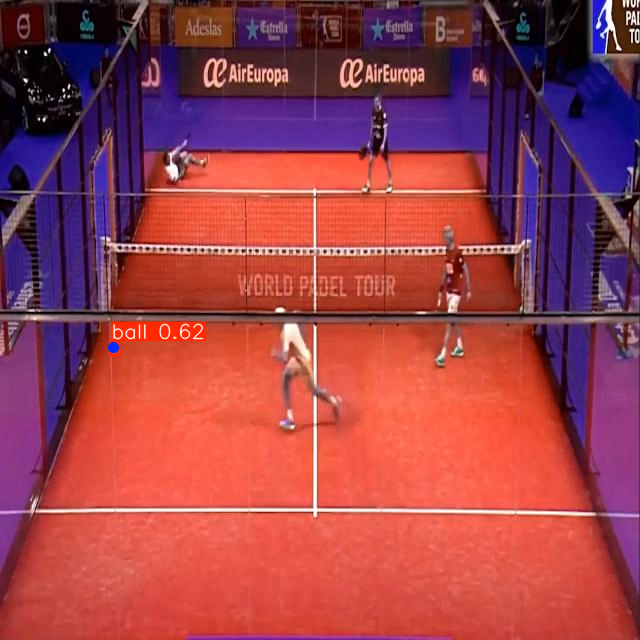

Detección para -101-_jpg.rf.8a2f866d2a41ef6e44aed27126013c22.jpg:
Pelota detectada con confianza: 0.62



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-102-_jpg.rf.cbfc158a67050519827ba8b831ed509f.jpg: 640x640 (no detections), 67.2ms
Speed: 2.8ms preprocess, 67.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


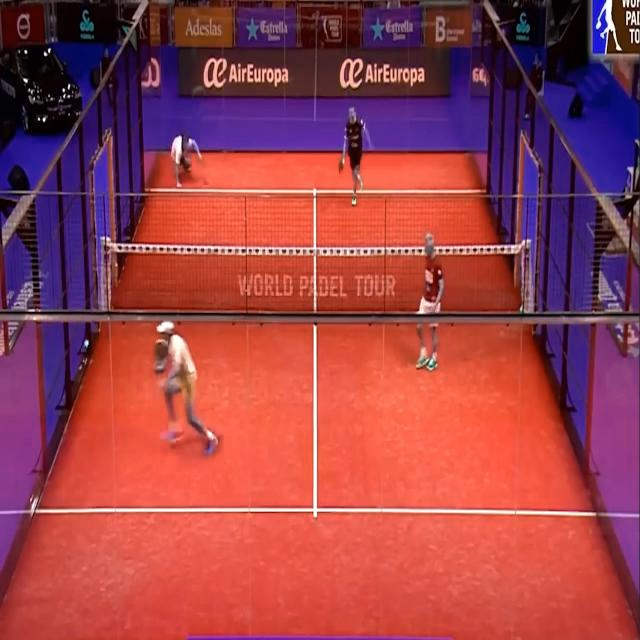

Detección para -102-_jpg.rf.cbfc158a67050519827ba8b831ed509f.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-103-_jpg.rf.5487fef8f339f569f19b3e010f9b761e.jpg: 640x640 (no detections), 67.3ms
Speed: 2.9ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


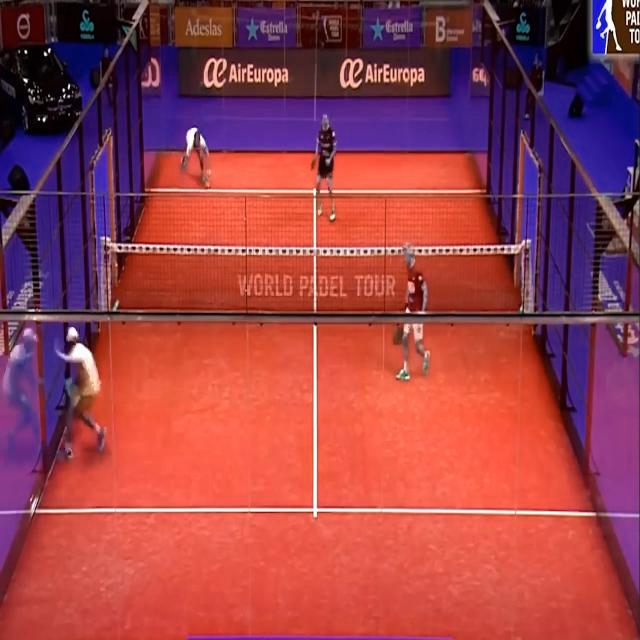

Detección para -103-_jpg.rf.5487fef8f339f569f19b3e010f9b761e.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-104-_jpg.rf.4774e3fd66528b0485ed7454b63ec642.jpg: 640x640 1 ball, 67.3ms
Speed: 2.0ms preprocess, 67.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


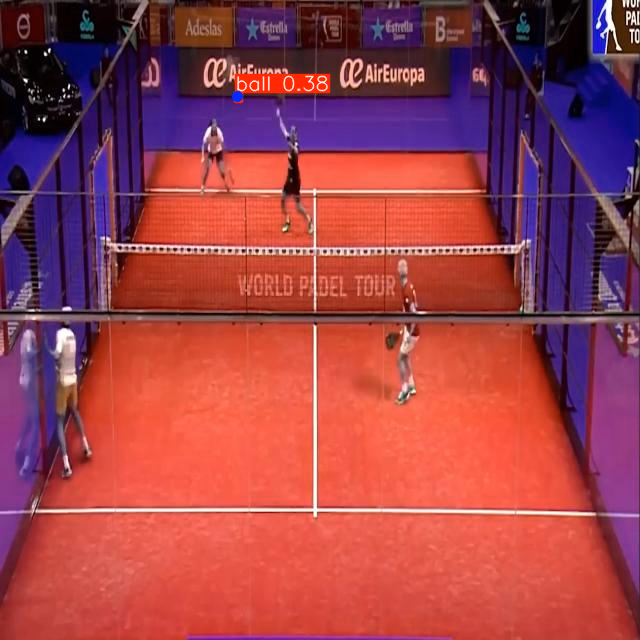

Detección para -104-_jpg.rf.4774e3fd66528b0485ed7454b63ec642.jpg:
Pelota detectada con confianza: 0.38



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-105-_jpg.rf.d7b784d62a695f2c02f31bdf4380a02a.jpg: 640x640 (no detections), 67.3ms
Speed: 2.0ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


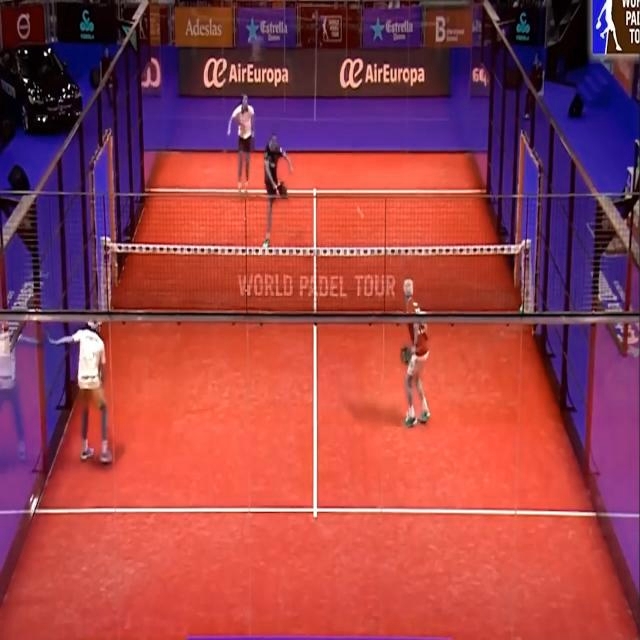

Detección para -105-_jpg.rf.d7b784d62a695f2c02f31bdf4380a02a.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-112-_jpg.rf.afb94e9b2abd4c923a66b7a6d4661d57.jpg: 640x640 (no detections), 67.4ms
Speed: 2.0ms preprocess, 67.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


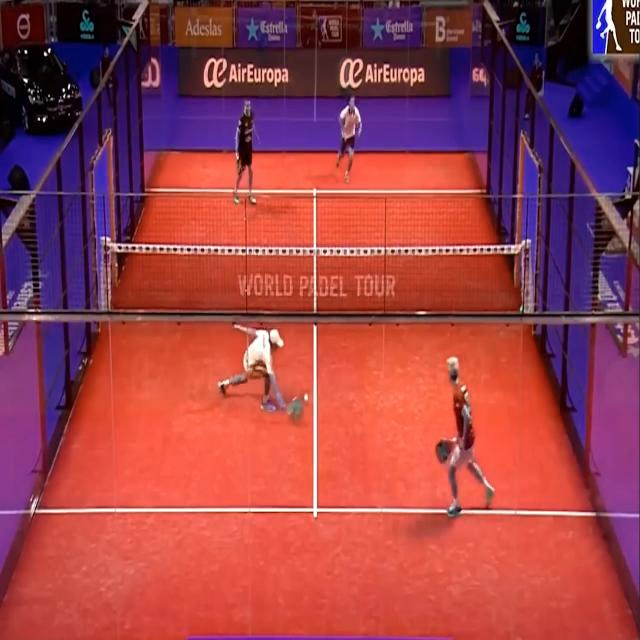

Detección para -112-_jpg.rf.afb94e9b2abd4c923a66b7a6d4661d57.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-119-_jpg.rf.4229af803702cc9bceb518c3685d0313.jpg: 640x640 1 ball, 67.4ms
Speed: 2.1ms preprocess, 67.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


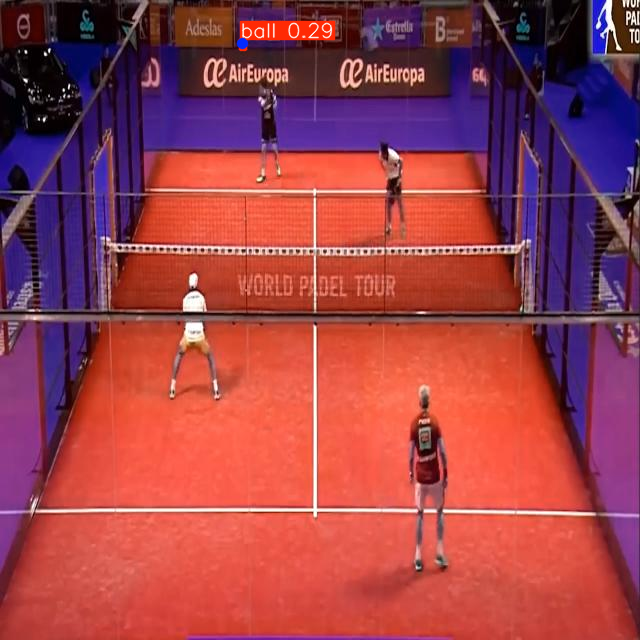

Detección para -119-_jpg.rf.4229af803702cc9bceb518c3685d0313.jpg:
Pelota detectada con confianza: 0.29



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-126-_jpg.rf.ee53e87522522cb3ab1828b7f6c673b2.jpg: 640x640 (no detections), 75.8ms
Speed: 2.1ms preprocess, 75.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


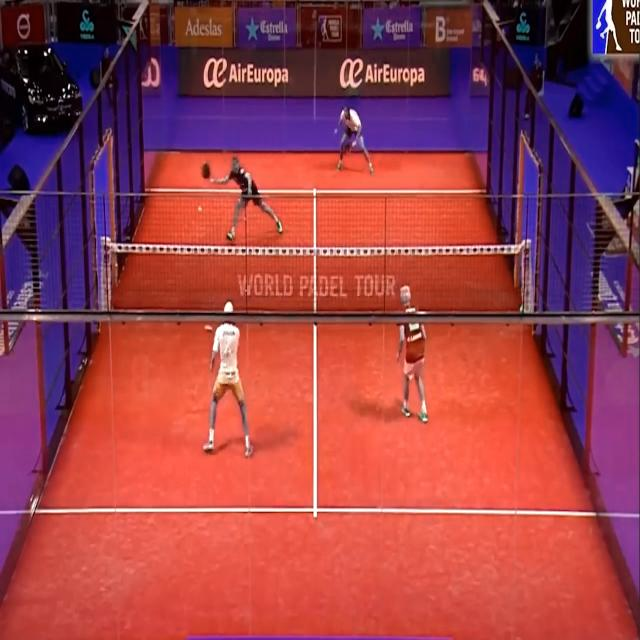

Detección para -126-_jpg.rf.ee53e87522522cb3ab1828b7f6c673b2.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-13-_jpg.rf.472084075a3d383bb30f38c0ff28c054.jpg: 640x640 (no detections), 80.4ms
Speed: 2.0ms preprocess, 80.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


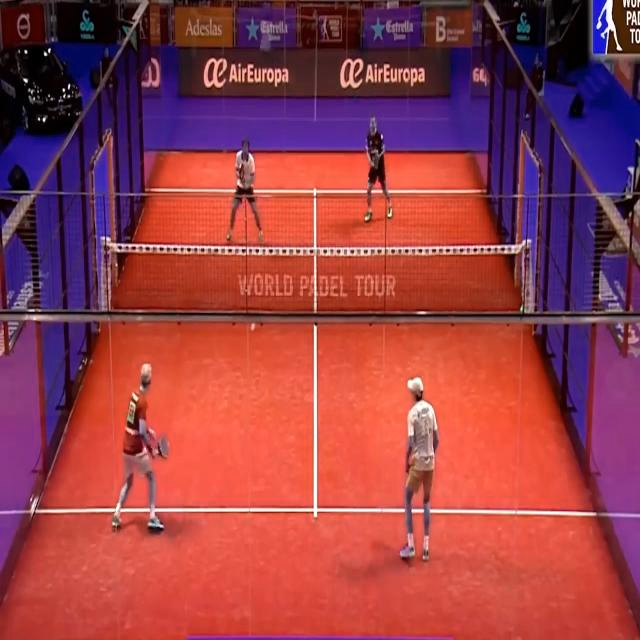

Detección para -13-_jpg.rf.472084075a3d383bb30f38c0ff28c054.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-131-_jpg.rf.0e2ee3f0a41087576cb385cffb8fb4fc.jpg: 640x640 1 ball, 79.1ms
Speed: 2.0ms preprocess, 79.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


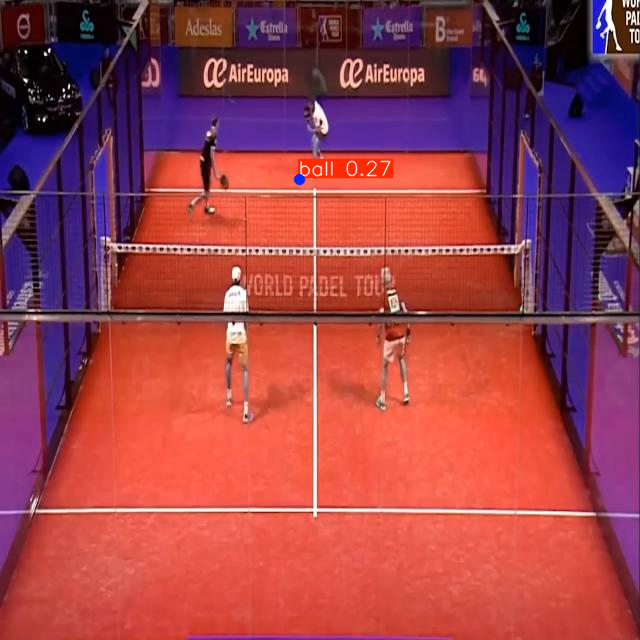

Detección para -131-_jpg.rf.0e2ee3f0a41087576cb385cffb8fb4fc.jpg:
Pelota detectada con confianza: 0.27



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-132-_jpg.rf.f336995d4050fab4bdd1b6ae1e60e406.jpg: 640x640 (no detections), 79.2ms
Speed: 6.2ms preprocess, 79.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


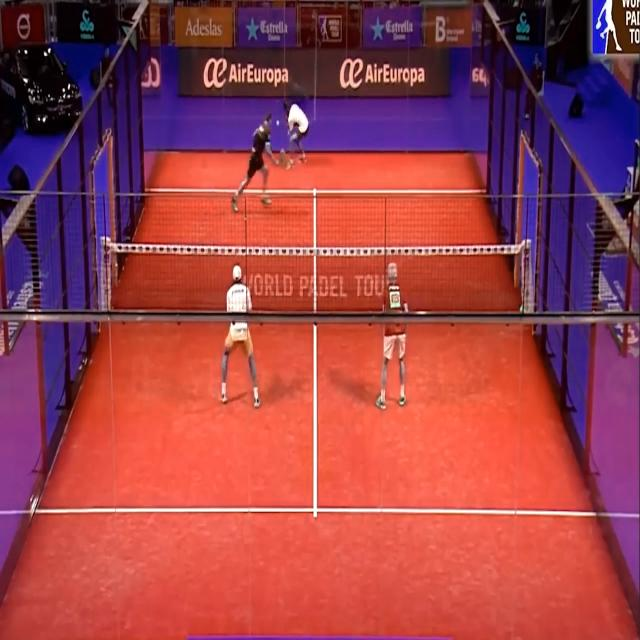

Detección para -132-_jpg.rf.f336995d4050fab4bdd1b6ae1e60e406.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-133-_jpg.rf.f9a0bd30418cf9a370dcd175b470c4d8.jpg: 640x640 (no detections), 79.1ms
Speed: 3.9ms preprocess, 79.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


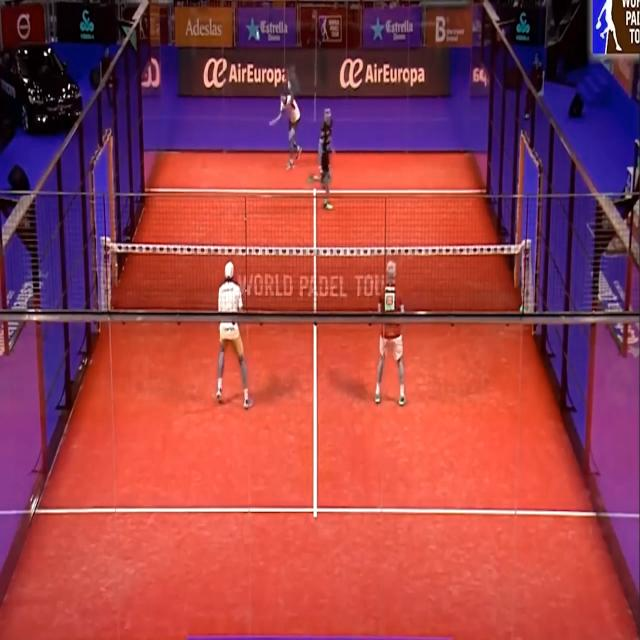

Detección para -133-_jpg.rf.f9a0bd30418cf9a370dcd175b470c4d8.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-136-_jpg.rf.5073d511592152d99d23691acddb9c0f.jpg: 640x640 (no detections), 79.1ms
Speed: 4.0ms preprocess, 79.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


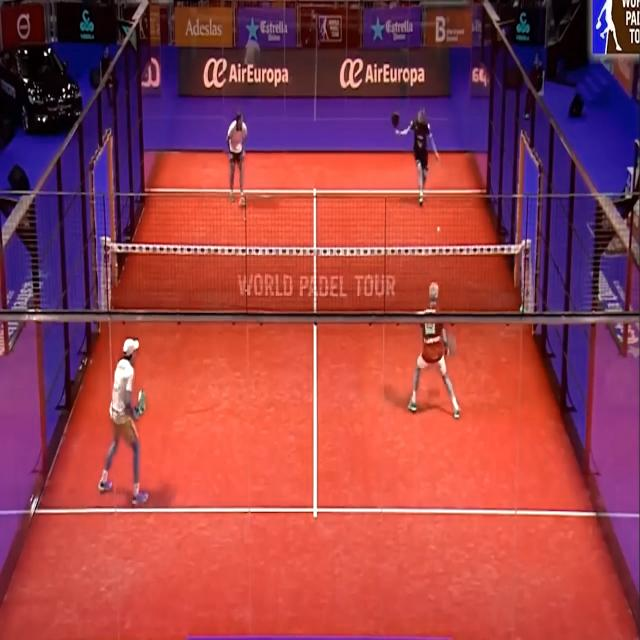

Detección para -136-_jpg.rf.5073d511592152d99d23691acddb9c0f.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-138-_jpg.rf.cbdb193285728fa51fe03ba7ce96455f.jpg: 640x640 (no detections), 79.8ms
Speed: 2.2ms preprocess, 79.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


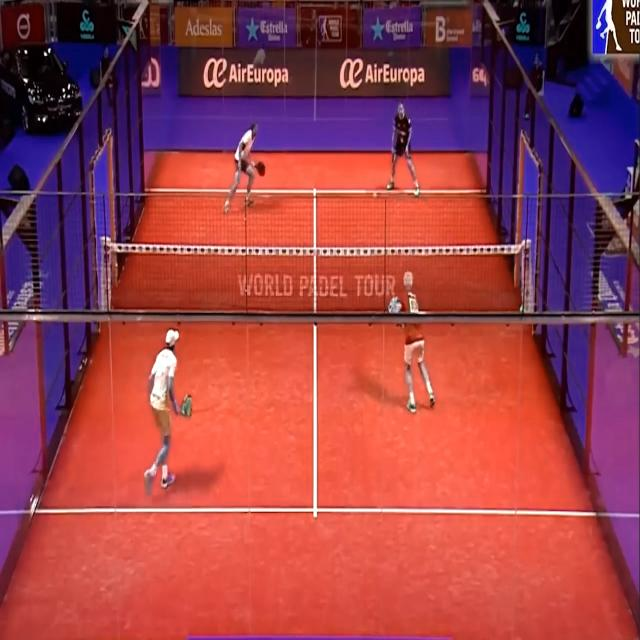

Detección para -138-_jpg.rf.cbdb193285728fa51fe03ba7ce96455f.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-140-_jpg.rf.809c6b15a3505542fd39334a897fb871.jpg: 640x640 (no detections), 83.7ms
Speed: 2.1ms preprocess, 83.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


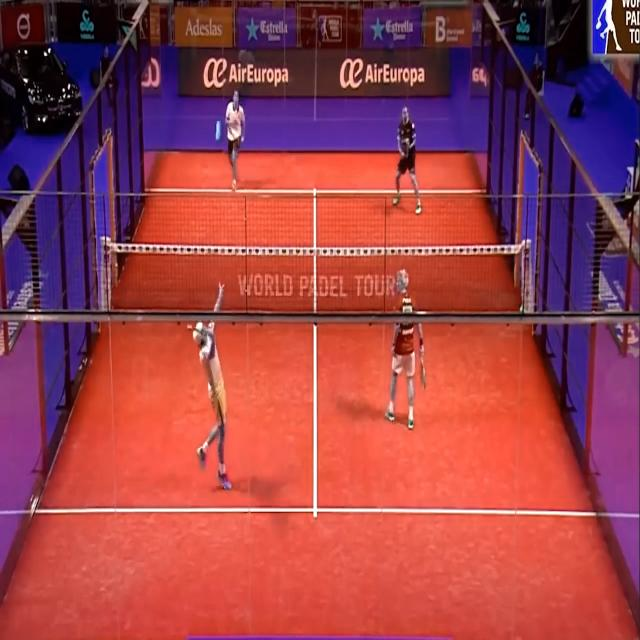

Detección para -140-_jpg.rf.809c6b15a3505542fd39334a897fb871.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-144-_jpg.rf.c06f6e761525270c8514606863db2b07.jpg: 640x640 (no detections), 84.7ms
Speed: 2.0ms preprocess, 84.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


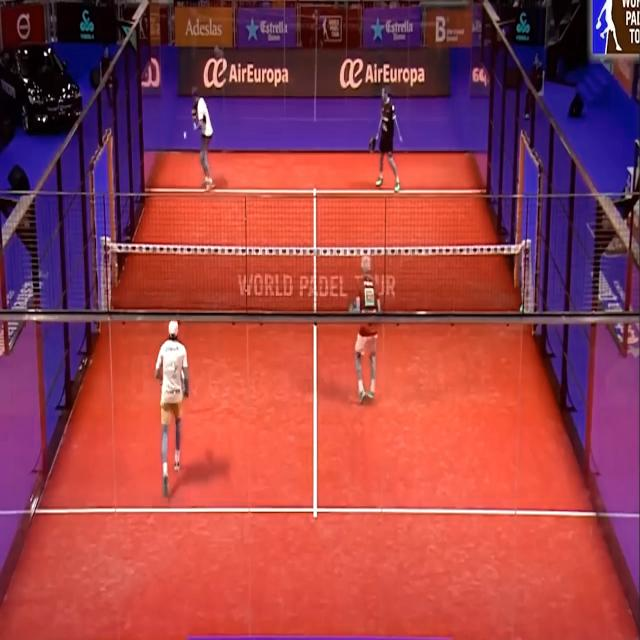

Detección para -144-_jpg.rf.c06f6e761525270c8514606863db2b07.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-151-_jpg.rf.ace1305d982c2fa9706b8aa3ac8895db.jpg: 640x640 1 ball, 80.4ms
Speed: 2.0ms preprocess, 80.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


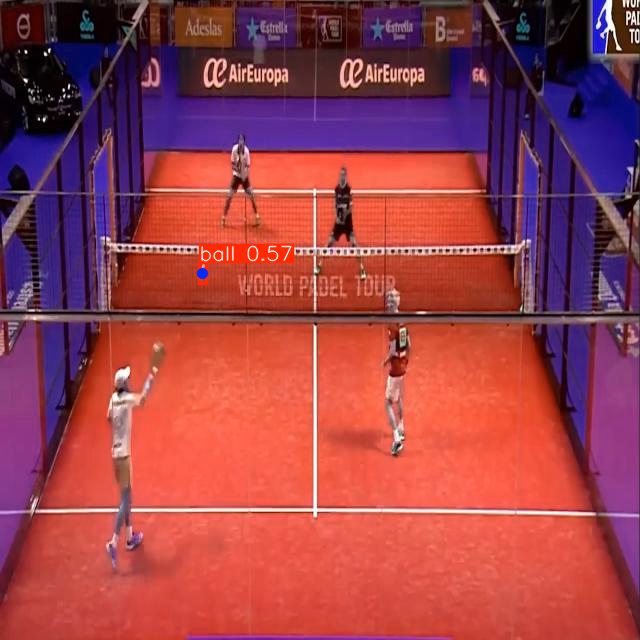

Detección para -151-_jpg.rf.ace1305d982c2fa9706b8aa3ac8895db.jpg:
Pelota detectada con confianza: 0.57



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-28-_jpg.rf.e9aa5ceb99ea825b02a085ce5074d5ed.jpg: 640x640 (no detections), 79.1ms
Speed: 1.8ms preprocess, 79.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


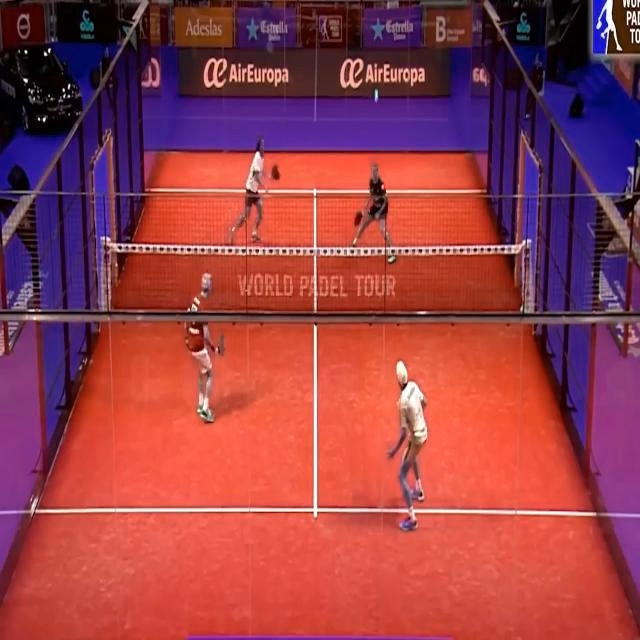

Detección para -28-_jpg.rf.e9aa5ceb99ea825b02a085ce5074d5ed.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-39-_jpg.rf.957f0dd635dbd152b7850c0c6aeee2fe.jpg: 640x640 (no detections), 79.1ms
Speed: 2.2ms preprocess, 79.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


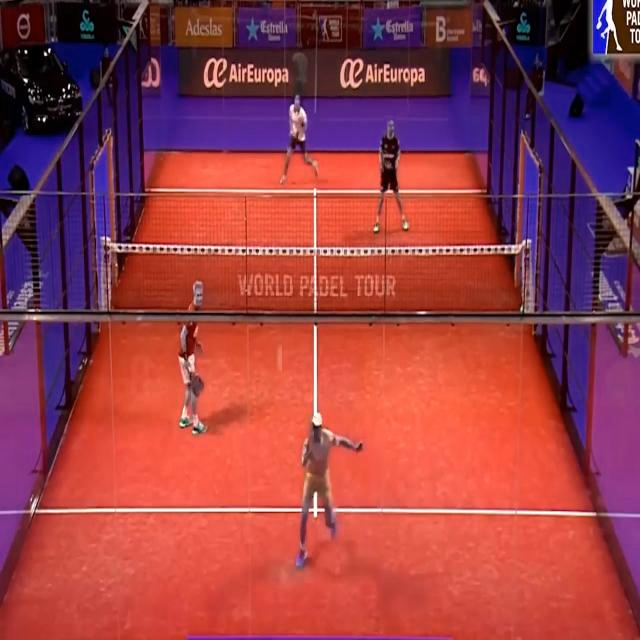

Detección para -39-_jpg.rf.957f0dd635dbd152b7850c0c6aeee2fe.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-40-_jpg.rf.47e343bfc82f71684f114b6c42e0017b.jpg: 640x640 (no detections), 79.1ms
Speed: 1.9ms preprocess, 79.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


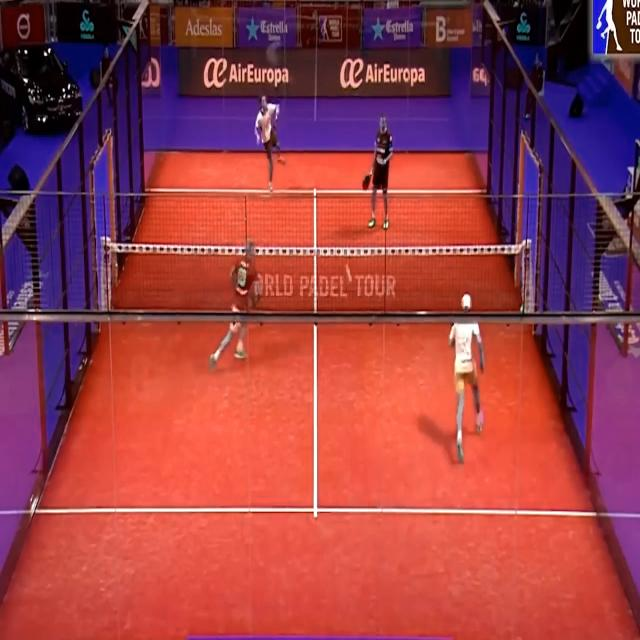

Detección para -40-_jpg.rf.47e343bfc82f71684f114b6c42e0017b.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-42-_jpg.rf.af486b71dd463ae5ea9e58423ee20e53.jpg: 640x640 (no detections), 79.1ms
Speed: 2.0ms preprocess, 79.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


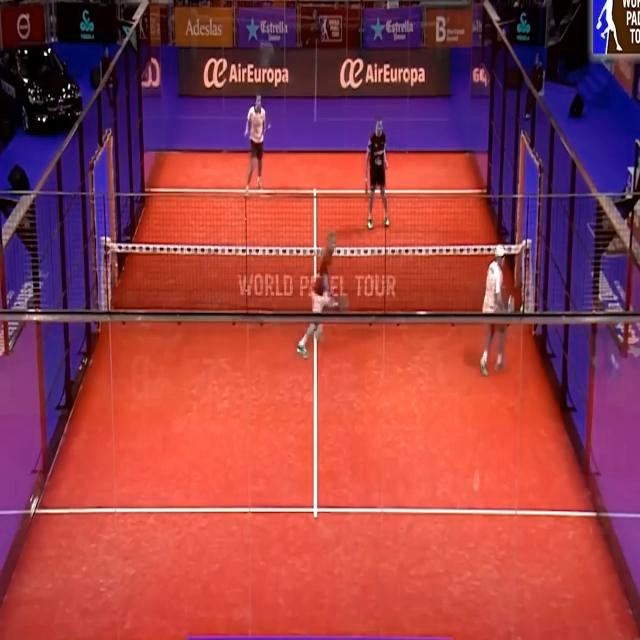

Detección para -42-_jpg.rf.af486b71dd463ae5ea9e58423ee20e53.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-47-_jpg.rf.90e9bc61730dc6b5332bc0a0752aedb3.jpg: 640x640 1 ball, 79.1ms
Speed: 2.0ms preprocess, 79.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


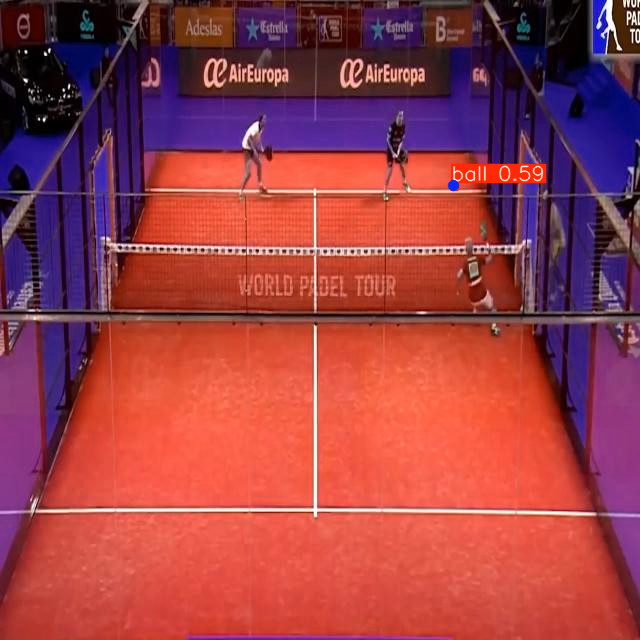

Detección para -47-_jpg.rf.90e9bc61730dc6b5332bc0a0752aedb3.jpg:
Pelota detectada con confianza: 0.59



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-67-_jpg.rf.220ce897da0f5c823fe0ab9aef3d0bd0.jpg: 640x640 1 ball, 79.5ms
Speed: 2.1ms preprocess, 79.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


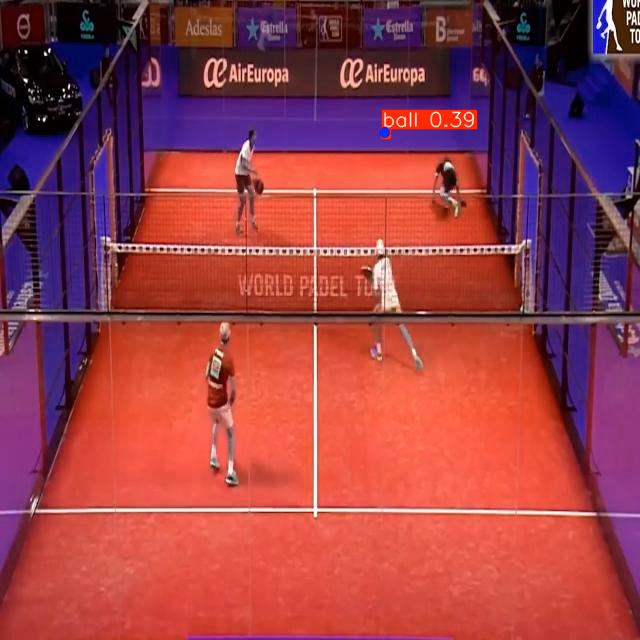

Detección para -67-_jpg.rf.220ce897da0f5c823fe0ab9aef3d0bd0.jpg:
Pelota detectada con confianza: 0.39



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-71-_jpg.rf.1bb07a6e28b404e9d244958bf8dedf07.jpg: 640x640 (no detections), 86.4ms
Speed: 1.9ms preprocess, 86.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


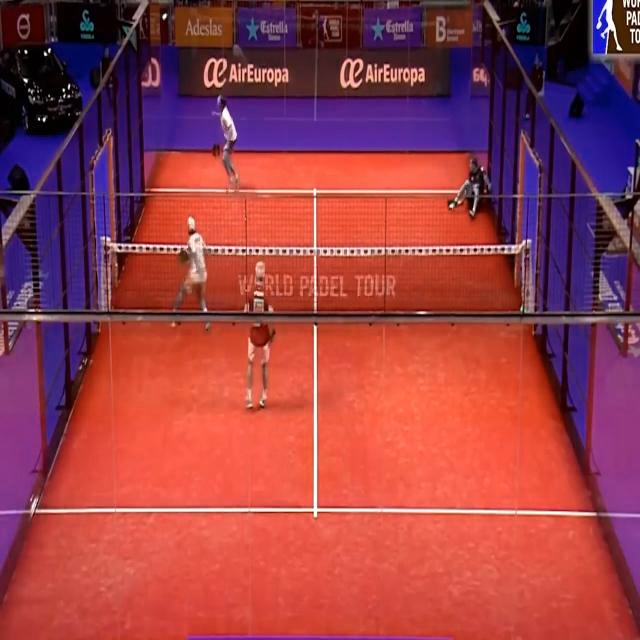

Detección para -71-_jpg.rf.1bb07a6e28b404e9d244958bf8dedf07.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-72-_jpg.rf.32fd56eea4976286c27e48dd88aaf67a.jpg: 640x640 (no detections), 80.5ms
Speed: 2.7ms preprocess, 80.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


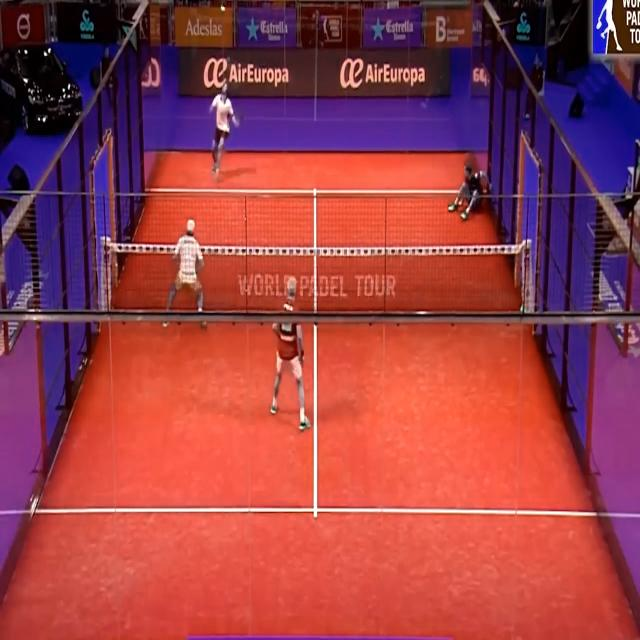

Detección para -72-_jpg.rf.32fd56eea4976286c27e48dd88aaf67a.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-73-_jpg.rf.ebd204d33a73c4f9f0284ee7b9808e82.jpg: 640x640 1 ball, 79.1ms
Speed: 2.0ms preprocess, 79.1ms inference, 6.4ms postprocess per image at shape (1, 3, 640, 640)


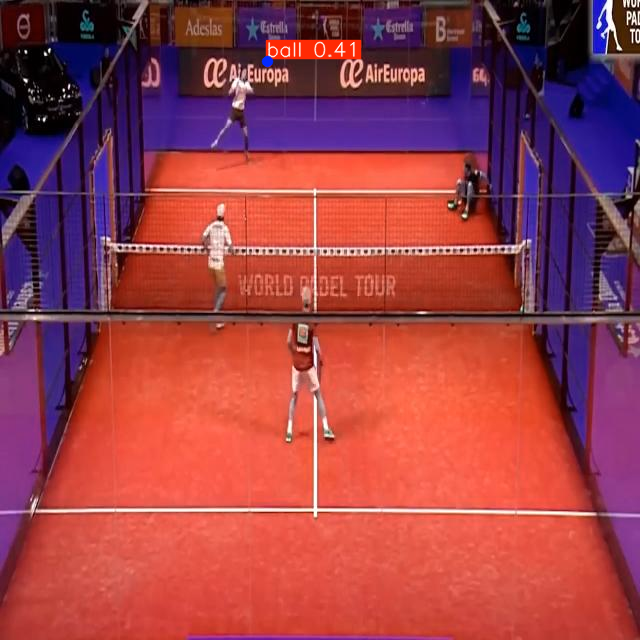

Detección para -73-_jpg.rf.ebd204d33a73c4f9f0284ee7b9808e82.jpg:
Pelota detectada con confianza: 0.41



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-76-_jpg.rf.b946513056421baa5faaecd1947c222f.jpg: 640x640 (no detections), 79.1ms
Speed: 1.9ms preprocess, 79.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


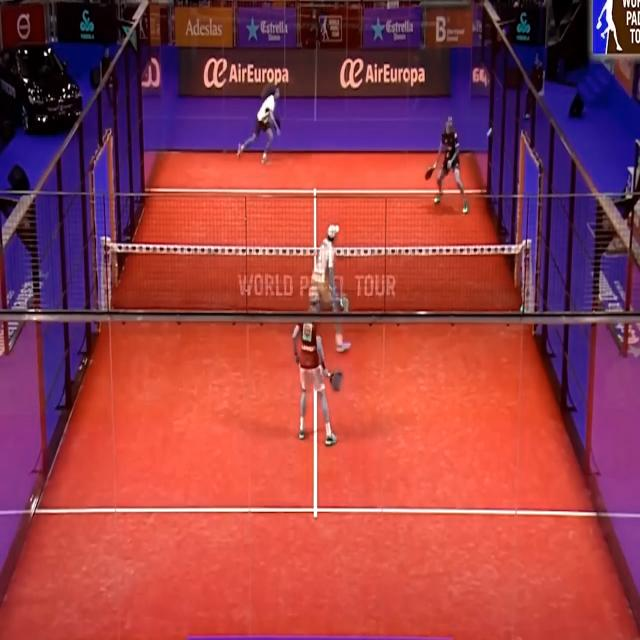

Detección para -76-_jpg.rf.b946513056421baa5faaecd1947c222f.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-87-_jpg.rf.70406950bed338a76e9c010707d8530b.jpg: 640x640 (no detections), 79.1ms
Speed: 2.1ms preprocess, 79.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


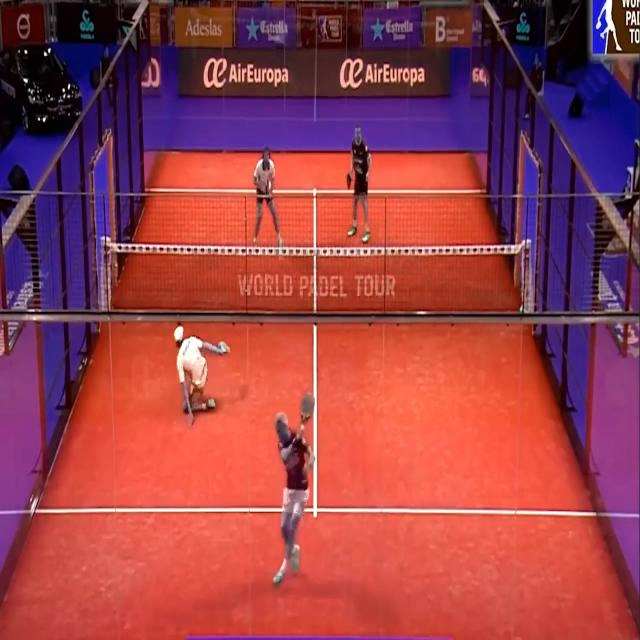

Detección para -87-_jpg.rf.70406950bed338a76e9c010707d8530b.jpg:
No se detectó la pelota en esta imagen.



image 1/1 /content/drive/MyDrive/padelPoints/padel-ball-1/valid/images/-92-_jpg.rf.b1d68be102a548d8e98a69c583c903ca.jpg: 640x640 (no detections), 79.1ms
Speed: 2.0ms preprocess, 79.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


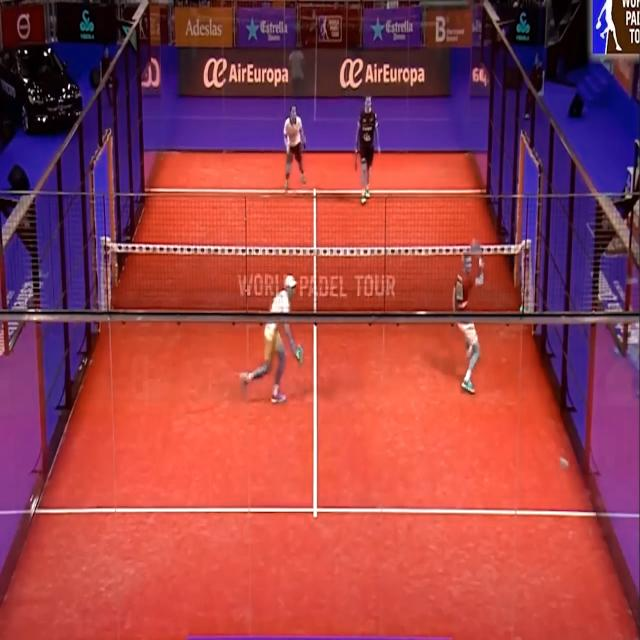

Detección para -92-_jpg.rf.b1d68be102a548d8e98a69c583c903ca.jpg:
No se detectó la pelota en esta imagen.


Resultados guardados en validation_results


In [7]:
from ultralytics import YOLO
import glob
import cv2
import os
from google.colab.patches import cv2_imshow
import numpy as np

# Cargar el modelo entrenado
model = YOLO('/content/drive/MyDrive/padelPoints/runs/pose/yolov8n_pose_custom_transfer2/weights/best.pt')

# Directorio que contiene las imágenes para validar
image_dir = '/content/drive/MyDrive/padelPoints/padel-ball-1/valid/images'

# Obtener todas las imágenes en el directorio
image_files = glob.glob(os.path.join(image_dir, '*.jpg')) + glob.glob(os.path.join(image_dir, '*.png'))

# Crear un directorio para guardar los resultados
results_dir = 'validation_results'
os.makedirs(results_dir, exist_ok=True)

# Procesar cada imagen
for img_path in image_files:
    # Realizar la predicción
    results = model(img_path)

    # Obtener la imagen con las detecciones dibujadas
    img = results[0].plot()

    # Convertir de BGR a RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Guardar la imagen con las detecciones
    output_path = os.path.join(results_dir, os.path.basename(img_path))
    cv2.imwrite(output_path, cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR))

    # Mostrar la imagen usando cv2_imshow
    cv2_imshow(img_rgb)

    # Mostrar información sobre la detección
    print(f"Detección para {os.path.basename(img_path)}:")

    # Buscar la detección de la pelota
    ball_detected = False
    for r in results:
        for box in r.boxes:
            cls = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = model.names[cls]
            if class_name == 'ball':
                ball_detected = True
                print(f"Pelota detectada con confianza: {conf:.2f}")
                break
        if ball_detected:
            break

    if not ball_detected:
        print("No se detectó la pelota en esta imagen.")

    print("\n")

print(f"Resultados guardados en {results_dir}")

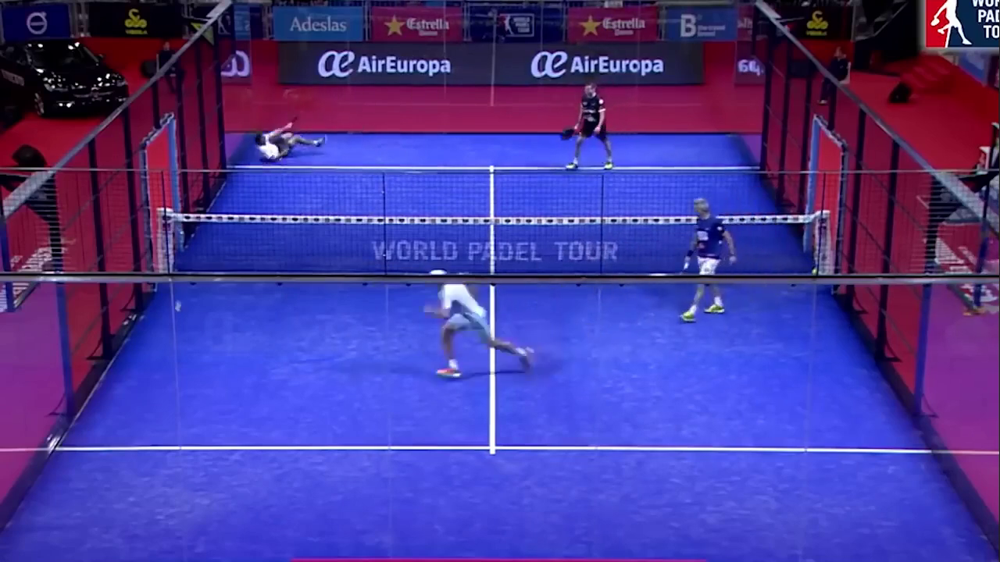

In [ ]:
from ultralytics import YOLO
import cv2
import os
from google.colab.patches import cv2_imshow
from IPython.display import display, clear_output
import ipywidgets as widgets

# Cargar el modelo entrenado
model = YOLO('/content/drive/MyDrive/padelPoints/runs/pose/yolov8n_pose_custom_transfer2/weights/best.pt')

# Ruta del archivo de video
video_path = '/content/drive/MyDrive/padelPoints/padel-video.mp4'

# Crear un directorio para guardar los resultados
results_dir = 'video_results'
os.makedirs(results_dir, exist_ok=True)

# Abrir el video
cap = cv2.VideoCapture(video_path)

# Obtener las propiedades del video
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Crear el objeto VideoWriter para guardar el video procesado
output_path = os.path.join(results_dir, 'output_video.mp4')
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_count = 0
display_handle = display(None, display_id=True)
progress_bar = widgets.IntProgress(min=0, max=int(cap.get(cv2.CAP_PROP_FRAME_COUNT)), description='Progreso:')
display(progress_bar)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1
    progress_bar.value = frame_count

    # Realizar la predicción
    results = model(frame)

    # Obtener la imagen con las detecciones dibujadas
    annotated_frame = results[0].plot()

    # Buscar la detección de la pelota
    ball_detected = False
    for r in results:
        for box in r.boxes:
            cls = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = model.names[cls]
            if class_name == 'ball':
                ball_detected = True
                print(f"Frame {frame_count}: Pelota detectada con confianza: {conf:.2f}")
                break
        if ball_detected:
            break

    if not ball_detected:
        print(f"Frame {frame_count}: No se detectó la pelota")

    # Escribir el frame procesado en el video de salida
    out.write(annotated_frame)

    # Mostrar el frame usando cv2_imshow (actualiza cada 30 frames)
    if frame_count % 30 == 0:
        clear_output(wait=True)
        cv2_imshow(annotated_frame)
        display_handle.update(widgets.Image(value=cv2.imencode('.jpg', annotated_frame)[1].tobytes()))

# Liberar recursos
cap.release()
out.release()

print(f"Video procesado guardado en {output_path}")
